# Исследование объявлений о продаже квартир

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Ваша задача — установить параметры. Это позволит построить автоматизированную систему: она отследит аномалии и мошенническую деятельность. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 

### Откройте файл с данными и изучите общую информацию. 

In [1]:
import pandas as pd
import plotly.express as px

In [2]:
data = pd.read_csv('datasets/real_estate_data.csv', sep='\t',decimal='.')

In [3]:
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,...,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,...,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

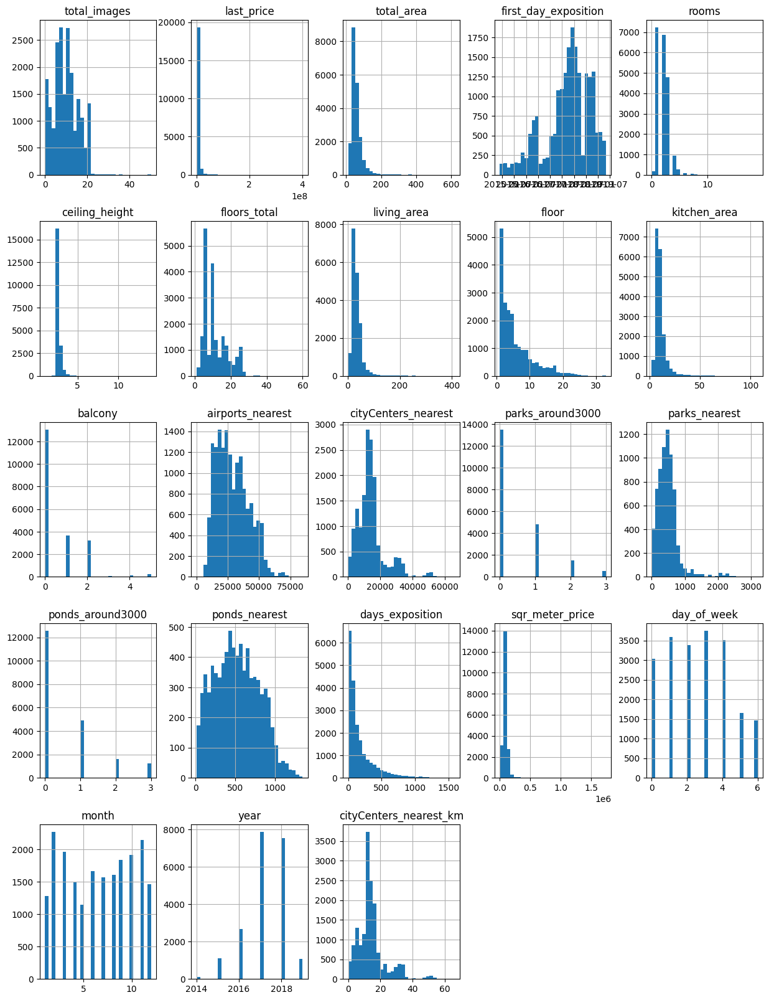

In [65]:
data.hist(figsize=(15,20), bins=30);

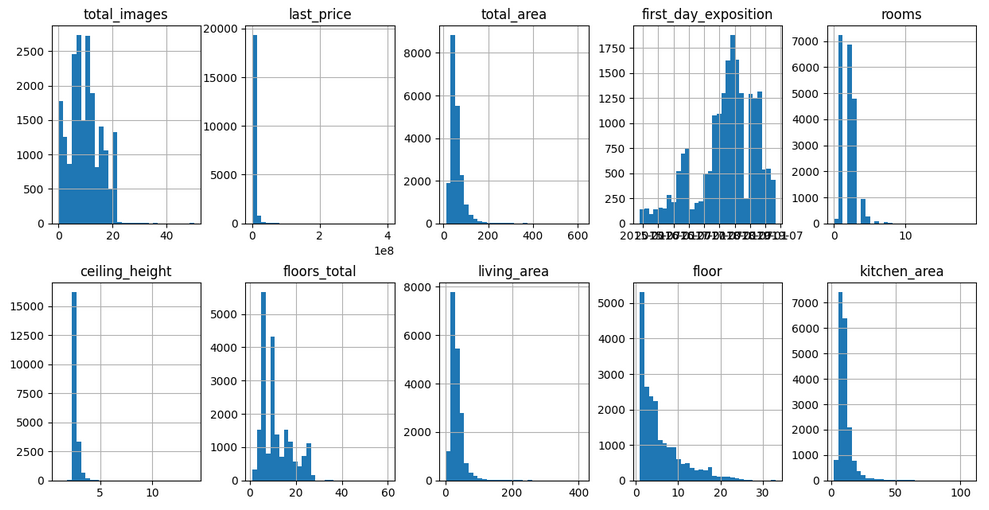

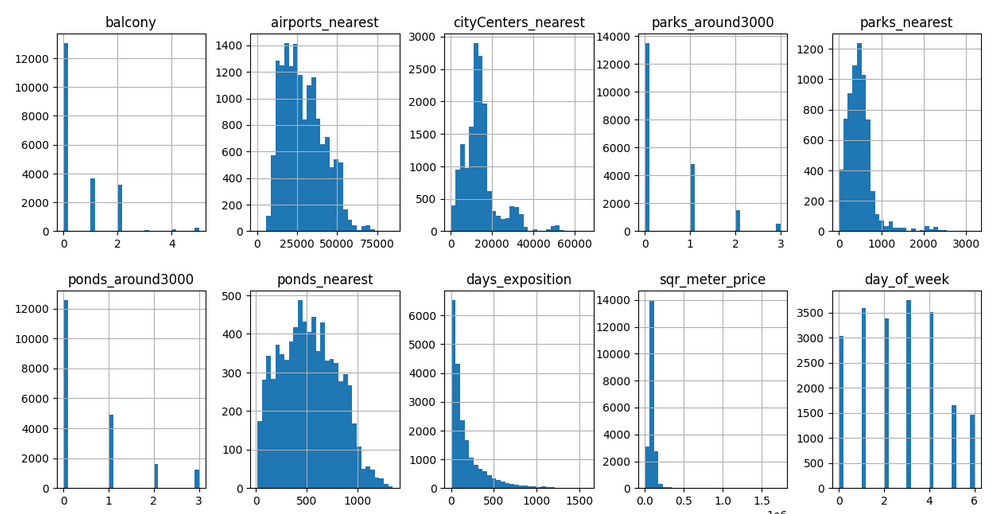

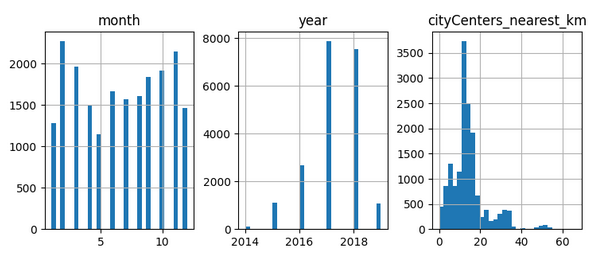

### Предобработка данных

#### Обработка пропусков

In [6]:
data.isna().mean().sort_values(ascending=False)

is_apartment            0.882906
parks_nearest           0.659100
ponds_nearest           0.615596
balcony                 0.486054
ceiling_height          0.387991
airports_nearest        0.233850
cityCenters_nearest     0.232879
ponds_around3000        0.232837
parks_around3000        0.232837
days_exposition         0.134225
kitchen_area            0.096122
living_area             0.080299
floors_total            0.003629
locality_name           0.002068
total_images            0.000000
last_price              0.000000
studio                  0.000000
floor                   0.000000
rooms                   0.000000
first_day_exposition    0.000000
total_area              0.000000
open_plan               0.000000
dtype: float64

- Поле **"is_apartment"** похож на признак апартаментов и сожержит всего два значения **True** и **False**, и скорее всего пропуски это **False**, то есть данный объект не является аппартаментами. Причины пропусков неверная интерпритация Fasle, ошибка в алгоритме при формировании выгрузки;
- В полях **parks_nearest** и **ponds_nearest** пропуски оставляем как есть, удалять нельзя, слишком большая доля пропусков, заменять на 0 - некорректно;
- Пропуски количества балконов **balcony** мы можем заменить на 0, потому что пропуски скорее всего - это отсутствие балона на объекте. Причины: сбой при загрузке/выгрузке данных; 
- В столбце **ceiling_height** (высота потолка) пропуски можно заменить на медианное значение высоты потолков всех объектов, которое составляет 2,65 м, что в принципе стандартно для жилых помещений (да и 3й квартиль = 2,8м, так что не сильно ошибемся если возьмем медиану). Берем именно медиану, потому что есть выбросы (максимально значение высоты потолка = 100м). Системная ошибка, либо человеческий фактор;
- Пропуски в расстоянии до аэропорта и центра города **airports_nearest**,**cityCenters_nearest** по аналогии с парками и прудами осталяем как есть;
- **ponds_around3000** и **parks_around3000** содержут информацию о количестве парков и прудов в радиусе 3000 м, пропуски логично заменить на 0, что будет говорить об отсутсвии парков для этого объекта в радиусе 3000 м;
- Пропуски в поле **days_exposition** придется удалить, потому что пропуски исказят статистику, заменить на 0 некорректно;
- В полях **kitchen_area, living_area** закономерностей нет, скорее всего "битые" данные, ставить 0 нелогично, оставляем как есть;
- Удалим строки с пропусками в столбцах **locality_name**,**floors_total** таких объектов мало;


In [7]:
# Заменяем пропуски в колонке is_apartment на False
data.is_apartment.fillna(False, inplace=True)

# Пропуски в высоте квартиры заменяем на медиану высоты всех объектов
data.ceiling_height.fillna(data.ceiling_height.median(),inplace=True)

# Заменяем пропуски в столбцах "количество балконов","количество прудов" и "количество парков" на 0
data.balcony.fillna(0, inplace=True)
data.ponds_around3000.fillna(0, inplace=True)
data.parks_around3000.fillna(0, inplace=True)

# Убираем строки с пропущенными названиями городов
data = data.loc[~data['locality_name'].isna()]

# Убираем строки с пропущенным общим кол-вом этажей
data = data.loc[~data['floors_total'].isna()]

# Убираем строки с пропущенным кол-вом дней размещения объявления
data = data.loc[~data['days_exposition'].isna()]

# Переиндексация дата сета
data.reset_index(drop=True, inplace=True)


In [8]:
data.isna().mean().sort_values(ascending=False)

parks_nearest           0.662303
ponds_nearest           0.616456
airports_nearest        0.228450
cityCenters_nearest     0.227371
kitchen_area            0.099196
living_area             0.081887
total_images            0.000000
ponds_around3000        0.000000
parks_around3000        0.000000
locality_name           0.000000
balcony                 0.000000
open_plan               0.000000
last_price              0.000000
studio                  0.000000
is_apartment            0.000000
floor                   0.000000
floors_total            0.000000
ceiling_height          0.000000
rooms                   0.000000
first_day_exposition    0.000000
total_area              0.000000
days_exposition         0.000000
dtype: float64

#### Преобразование типов данных

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          20394 non-null  int64  
 1   last_price            20394 non-null  float64
 2   total_area            20394 non-null  float64
 3   first_day_exposition  20394 non-null  object 
 4   rooms                 20394 non-null  int64  
 5   ceiling_height        20394 non-null  float64
 6   floors_total          20394 non-null  float64
 7   living_area           18724 non-null  float64
 8   floor                 20394 non-null  int64  
 9   is_apartment          20394 non-null  bool   
 10  studio                20394 non-null  bool   
 11  open_plan             20394 non-null  bool   
 12  kitchen_area          18371 non-null  float64
 13  balcony               20394 non-null  float64
 14  locality_name         20394 non-null  object 
 15  airports_nearest   

Столбцы, в которых необходимо изменить тип данных:
- **'first_day_exposition'** - datetime64 -----дата, без времени, оно нам не нужно
- **'floors_total'** - int64 -----кол-во этажей не может быть дробным
- **'balcony'** - int64 -----половины балкона тоже не может быть
- **'parks_around3000'** - int64 -----как и половины парка
- **'ponds_around3000'** - int64 -----и половины пруда соответсвенно
- **'days_exposition'** - int64 -----кол-во дней так же целое число

In [10]:
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'].str.strip(), format='%Y-%m-%d')

wrong_type_cols = {
                  'floors_total':'int64',
                  'balcony':'int64',
                  'parks_around3000':'int64',
                  'ponds_around3000':'int64',
                  'days_exposition':'int64'}

data = data.astype(wrong_type_cols)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          20394 non-null  int64         
 1   last_price            20394 non-null  float64       
 2   total_area            20394 non-null  float64       
 3   first_day_exposition  20394 non-null  datetime64[ns]
 4   rooms                 20394 non-null  int64         
 5   ceiling_height        20394 non-null  float64       
 6   floors_total          20394 non-null  int64         
 7   living_area           18724 non-null  float64       
 8   floor                 20394 non-null  int64         
 9   is_apartment          20394 non-null  bool          
 10  studio                20394 non-null  bool          
 11  open_plan             20394 non-null  bool          
 12  kitchen_area          18371 non-null  float64       
 13  balcony         

#### Обработка дубликатов

In [12]:
len(data.locality_name.unique())

330

In [13]:
sorted(data.locality_name.unique())

['Бокситогорск',
 'Волосово',
 'Волхов',
 'Всеволожск',
 'Выборг',
 'Высоцк',
 'Гатчина',
 'Зеленогорск',
 'Ивангород',
 'Каменногорск',
 'Кингисепп',
 'Кириши',
 'Кировск',
 'Колпино',
 'Коммунар',
 'Красное Село',
 'Кронштадт',
 'Кудрово',
 'Лодейное Поле',
 'Ломоносов',
 'Луга',
 'Любань',
 'Никольское',
 'Новая Ладога',
 'Отрадное',
 'Павловск',
 'Петергоф',
 'Пикалёво',
 'Подпорожье',
 'Приморск',
 'Приозерск',
 'Пушкин',
 'Санкт-Петербург',
 'Светогорск',
 'Сертолово',
 'Сестрорецк',
 'Сланцы',
 'Сосновый Бор',
 'Сясьстрой',
 'Тихвин',
 'Тосно',
 'Шлиссельбург',
 'городской поселок Большая Ижора',
 'городской поселок Янино-1',
 'городской посёлок Будогощь',
 'городской посёлок Виллози',
 'городской посёлок Мга',
 'городской посёлок Назия',
 'городской посёлок Новоселье',
 'городской посёлок Павлово',
 'городской посёлок Рощино',
 'городской посёлок Свирьстрой',
 'городской посёлок Фёдоровское',
 'городской посёлок Янино-1',
 'деревня Агалатово',
 'деревня Аро',
 'деревня Батово',

Основные проблемы неявных дубликатов:
1. "пос**е**лок" vs "пос**ё**лок" (основная проблема)
2. "поселок городского типа" vs "городской поселок"
3. "поселок" vs "деревня" (то есть один и тот же населенный пункт указан как поселок и как деревня)

Действия (правильное написание берем из яндекс карт):
1. Меняем все пос**е**лки на пос**ё**лки.
2. Все **посёлок городского типа** заменим на **городской посёлок**.
3. Так как случаев деревня/поселок всего пять, то загуглив каждый снатовится понятно, что действительно в 4 из 5 случаев есть и деревня и поселок с одинаковым названием, и что примечательно поселок образован вокруг деревни. Исключение **деревня Гарболово**, поселка такого нет. Заменим **поселок** на **деревня** для данного населенного пункта.
4. И последнее поселки при железнодорожной станиции, помимо дубликатов, все эти поселки в яндекс картах называются "посёлок при железнодорожной станции..", переименуем все **"поселок станции"**  в **"посёлок при железнодорожной станции.."**.
5. Все **"садовое товарищество"** переименуем в *"садоводческое некоммерческое товарищество"**, как в яндекс картах. Это одна сущьность.

In [14]:
data.locality_name = data.locality_name.str.replace('поселок','посёлок')
data.locality_name = data.locality_name.str.replace('посёлок городского типа','городской посёлок')
data.locality_name = data.locality_name.str.replace('посёлок Гарболово','деревня Гарболово')
data.locality_name = data.locality_name.str.replace('посёлок станции','посёлок при железнодорожной станции')
data.locality_name = data.locality_name.str.replace('садовое товарищество','садоводческое некоммерческое товарищество')

In [15]:
len(data.locality_name.unique())

292

In [16]:
sorted(data.locality_name.unique())

['Бокситогорск',
 'Волосово',
 'Волхов',
 'Всеволожск',
 'Выборг',
 'Высоцк',
 'Гатчина',
 'Зеленогорск',
 'Ивангород',
 'Каменногорск',
 'Кингисепп',
 'Кириши',
 'Кировск',
 'Колпино',
 'Коммунар',
 'Красное Село',
 'Кронштадт',
 'Кудрово',
 'Лодейное Поле',
 'Ломоносов',
 'Луга',
 'Любань',
 'Никольское',
 'Новая Ладога',
 'Отрадное',
 'Павловск',
 'Петергоф',
 'Пикалёво',
 'Подпорожье',
 'Приморск',
 'Приозерск',
 'Пушкин',
 'Санкт-Петербург',
 'Светогорск',
 'Сертолово',
 'Сестрорецк',
 'Сланцы',
 'Сосновый Бор',
 'Сясьстрой',
 'Тихвин',
 'Тосно',
 'Шлиссельбург',
 'городской посёлок Большая Ижора',
 'городской посёлок Будогощь',
 'городской посёлок Важины',
 'городской посёлок Виллози',
 'городской посёлок Вознесенье',
 'городской посёлок Вырица',
 'городской посёлок Дружная Горка',
 'городской посёлок Дубровка',
 'городской посёлок Ефимовский',
 'городской посёлок Кондратьево',
 'городской посёлок Красный Бор',
 'городской посёлок Кузнечное',
 'городской посёлок Кузьмоловский',
 

#### Замена редких и выбивающихся из общей логики значений

In [17]:
sorted(data.ceiling_height.unique(), reverse=True)

[100.0,
 27.5,
 27.0,
 26.0,
 25.0,
 24.0,
 22.6,
 14.0,
 10.3,
 8.3,
 8.0,
 6.0,
 5.8,
 5.6,
 5.3,
 5.2,
 5.0,
 4.9,
 4.8,
 4.7,
 4.65,
 4.5,
 4.45,
 4.4,
 4.37,
 4.25,
 4.2,
 4.19,
 4.15,
 4.14,
 4.1,
 4.06,
 4.0,
 3.98,
 3.95,
 3.93,
 3.9,
 3.88,
 3.87,
 3.86,
 3.85,
 3.84,
 3.83,
 3.82,
 3.8,
 3.78,
 3.76,
 3.75,
 3.7,
 3.68,
 3.67,
 3.66,
 3.65,
 3.63,
 3.6,
 3.59,
 3.57,
 3.56,
 3.55,
 3.54,
 3.53,
 3.52,
 3.51,
 3.5,
 3.49,
 3.48,
 3.47,
 3.46,
 3.45,
 3.44,
 3.43,
 3.42,
 3.4,
 3.39,
 3.38,
 3.37,
 3.36,
 3.35,
 3.34,
 3.33,
 3.32,
 3.31,
 3.3,
 3.29,
 3.28,
 3.27,
 3.26,
 3.25,
 3.24,
 3.23,
 3.22,
 3.21,
 3.2,
 3.18,
 3.17,
 3.16,
 3.15,
 3.14,
 3.13,
 3.12,
 3.11,
 3.1,
 3.09,
 3.08,
 3.07,
 3.06,
 3.05,
 3.04,
 3.03,
 3.02,
 3.01,
 3.0,
 2.99,
 2.98,
 2.97,
 2.96,
 2.95,
 2.94,
 2.93,
 2.92,
 2.91,
 2.9,
 2.89,
 2.88,
 2.87,
 2.86,
 2.85,
 2.84,
 2.83,
 2.82,
 2.81,
 2.8,
 2.79,
 2.78,
 2.77,
 2.76,
 2.75,
 2.74,
 2.73,
 2.72,
 2.71,
 2.7,
 2.69,
 2.68,
 2.67,
 2.66,
 2.65,

Значения 20 и больше замним на 2.0 и тп. Скорее всего произошло смещение на порядок.

In [18]:
data['ceiling_height'] = data['ceiling_height'].apply(lambda x: x * 0.1 if x >= 20 else x)

Так же в даблице есть два объекта со странным соотношением цены и общей площади. Индекса (12971,19540) \
У первого слишком высокая цена при относительно небольшой площади. \
У второго наоборот, слишком низкая цена для площади в 2 раза большей. \
При том что эти объекты далеко от центра. \
Удаляем эти записи.

In [19]:
data.sort_values(by='last_price',ascending=False).head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
11157,19,763000000.0,400.0,2017-09-30,7,2.65,10,250.0,10,False,...,NaN,2,Санкт-Петербург,25108.0,3956.0,1,530.0,3,756.0,33
16839,8,420000000.0,900.0,2017-12-06,12,2.80,25,409.7,25,False,...,112.0,0,Санкт-Петербург,30706.0,7877.0,0,NaN,2,318.0,106
12655,15,401300000.0,401.0,2016-02-20,5,2.65,9,204.0,9,False,...,24.0,3,Санкт-Петербург,21912.0,2389.0,1,545.0,1,478.0,393
1245,19,330000000.0,190.0,2018-04-04,3,3.50,7,95.0,5,False,...,40.0,0,Санкт-Петербург,23011.0,1197.0,3,519.0,3,285.0,233
13474,20,300000000.0,618.0,2017-12-18,7,3.40,7,258.0,5,False,...,70.0,0,Санкт-Петербург,32440.0,5297.0,0,NaN,2,198.0,111


In [20]:
data.drop(labels=[11157,16839], axis=0, inplace=True)

Так же есть объект с анамально низкой ценой и большой площадью, удалим его.

Аномально низкая цена у объекта с индексом 8793, при такой большой площади

In [21]:
data.sort_values(by='last_price',ascending=False).tail(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
18858,0,470000.0,37.0,2018-02-18,1,2.65,3,NaN,3,False,...,NaN,0,посёлок Совхозный,NaN,NaN,0,NaN,0,NaN,45
20212,11,470000.0,44.5,2018-07-02,2,2.65,2,28.0,2,False,...,7.5,0,Сланцы,NaN,NaN,0,NaN,0,NaN,298
16246,1,470000.0,41.0,2018-02-11,1,2.65,5,32.0,3,False,...,9.0,0,деревня Выскатка,NaN,NaN,0,NaN,0,NaN,46
13971,14,450000.0,38.5,2018-07-11,2,2.65,2,NaN,1,False,...,NaN,0,деревня Вахнова Кара,NaN,NaN,0,NaN,0,NaN,45
4893,7,450000.0,42.0,2017-07-31,2,2.65,1,23.0,1,False,...,5.8,0,городской посёлок Будогощь,NaN,NaN,0,NaN,0,NaN,233
15223,0,450000.0,36.5,2018-02-01,1,2.65,5,17.3,4,False,...,8.5,1,деревня Ям-Тесово,NaN,NaN,0,NaN,0,NaN,120
8247,7,450000.0,43.4,2018-08-31,2,2.65,5,30.3,3,False,...,5.5,0,деревня Старополье,NaN,NaN,0,NaN,0,NaN,96
14020,18,440000.0,40.0,2018-07-10,1,2.65,5,NaN,1,False,...,NaN,0,деревня Старополье,NaN,NaN,0,NaN,0,NaN,45
12835,5,430000.0,54.0,2018-06-26,2,2.65,3,NaN,3,False,...,NaN,0,посёлок при железнодорожной станции Свирь,NaN,NaN,0,NaN,0,NaN,44
7574,7,12190.0,109.0,2019-03-20,2,2.75,25,32.0,25,False,...,40.5,0,Санкт-Петербург,36421.0,9176.0,1,805.0,0,NaN,8


In [22]:
data.drop(labels=[7574], axis=0, inplace=True)

In [23]:
data.reset_index(drop=True, inplace=True)

### Посчитайте и добавьте в таблицу новые столбцы

In [24]:
# Добавляем столбец со стоимостью за 1 кв метр
data['sqr_meter_price'] = data['last_price'] / data['total_area']
data['sqr_meter_price'] = data['sqr_meter_price'].round(2)

In [25]:
# Добавляем столбец с номером дня недели размещения публикации
data['day_of_week'] = data['first_day_exposition'].dt.dayofweek

In [26]:
# Добавляем столбец с месяцем даты размещения публикации
data['month'] = data['first_day_exposition'].dt.month

In [27]:
# Добавляем столбец с годом даты размещения публикации
data['year'] = data['first_day_exposition'].dt.year

In [28]:
# Добавляем столбец с типом этажа квартиры
def check_floor(row):
    if row['floor'] == 1:
        return "первый"
    elif row['floor'] == row['floors_total']:
        return "последний"
    else:
        return 'другой'

data['floor_type'] = data.apply(lambda row:check_floor(row), axis=1)

In [29]:
# Добавляем столбец с расстоянием до центра в км.     
data['cityCenters_nearest_km'] = data['cityCenters_nearest'] / 1000
data['cityCenters_nearest_km'] = data['cityCenters_nearest_km'].round(0)

In [30]:
# Сразу округлим "общую стоимость" объекта
data.last_price = data.last_price.round(0)

### Проведите исследовательский анализ данных

Изучим гистограммы некоторых полей

In [31]:
cols_names = {'total_area':'общая площадь',
              'living_area':'жилая площадь',
              'kitchen_area':'площадь кухни',
              'last_price':'цена объекта',
              'rooms':'количество комнат',
              'ceiling_height':'высота потолков',
              'floor':'этаж квартиры',
              'floor_type':'тип этажа квартиры',
              'floors_total':'общее количество этажей в доме',
              'cityCenters_nearest':'расстояние до центра города в метрах',
              'airports_nearest':'расстояние до ближайшего аэропорта',
              'parks_nearest':'расстояние до ближайшего парка',
              'day_of_week':'день',
              'month':'месяц',
              'year':'год',
              'days_exposition':'кол-во дней размещения объявления','one_km_centre_price':'стоимость 1 км до центра'}

def hist_creator(df,col,bins):
    
    display(df[col].describe())

    fig = px.histogram(df, x = col, nbins=bins, title = cols_names[col])
    fig.show()

In [32]:
hist_creator(data,'total_area',200)

count    20391.000000
mean        58.773822
std         33.468492
min         12.000000
25%         39.500000
50%         50.800000
75%         67.800000
max        618.000000
Name: total_area, dtype: float64

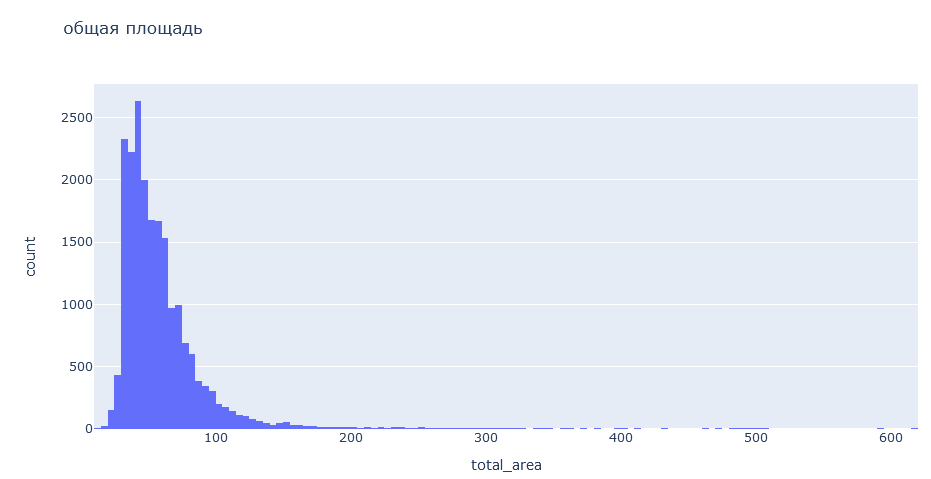

In [33]:
hist_creator(data,'living_area',200)

count    18721.000000
mean        33.496727
std         21.093756
min          2.000000
25%         18.300000
50%         30.000000
75%         41.500000
max        409.000000
Name: living_area, dtype: float64

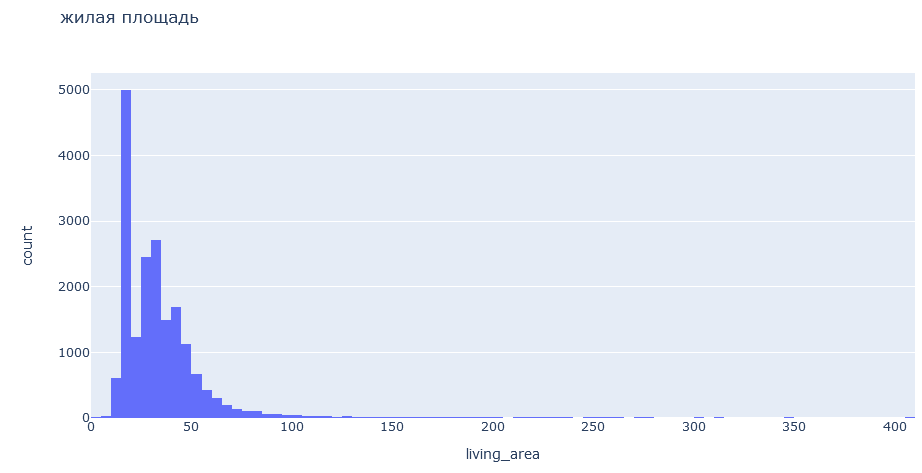

In [34]:
hist_creator(data,'kitchen_area',200)

count    18369.000000
mean        10.419107
std          5.621138
min          2.000000
25%          7.000000
50%          9.090000
75%         11.900000
max        107.000000
Name: kitchen_area, dtype: float64

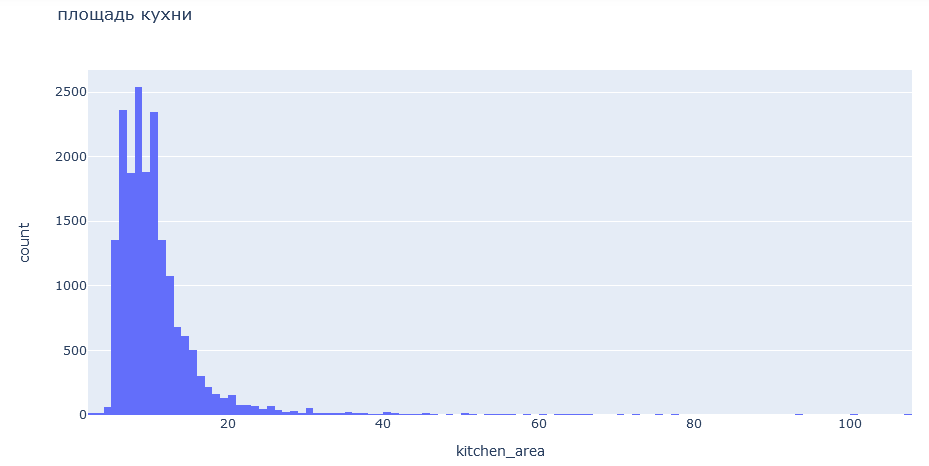

In [35]:
# Для наглядности показателей метода discribe разделим все данные поля last_price на 1 000 000
mln_price = data[['last_price']] / 1000000
hist_creator(mln_price,'last_price',200)

count    20391.000000
mean         6.206627
std          9.060539
min          0.430000
25%          3.400000
50%          4.500000
75%          6.500000
max        401.300000
Name: last_price, dtype: float64

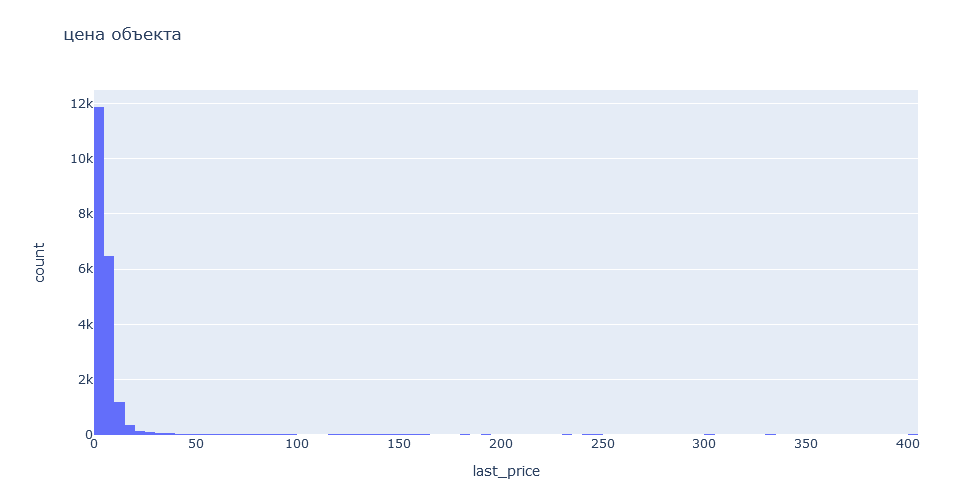

In [36]:
hist_creator(data,'rooms',30)

count    20391.000000
mean         2.023638
std          1.052348
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         19.000000
Name: rooms, dtype: float64

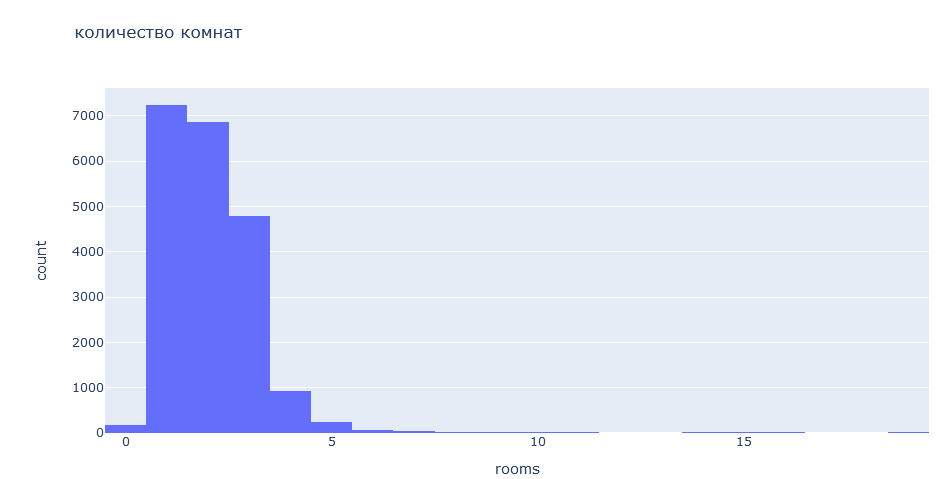

In [37]:
data.loc[data['rooms'] == 19]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sqr_meter_price,day_of_week,month,year,floor_type,cityCenters_nearest_km
12479,6,32250000.0,374.6,2018-06-09,19,2.65,5,264.5,2,False,...,NaN,2,548.0,114,86091.83,5,6,2018,другой,4.0


In [38]:
hist_creator(data,'ceiling_height',30)

count    20391.000000
mean         2.693107
std          0.249373
min          1.000000
25%          2.600000
50%          2.650000
75%          2.700000
max         14.000000
Name: ceiling_height, dtype: float64

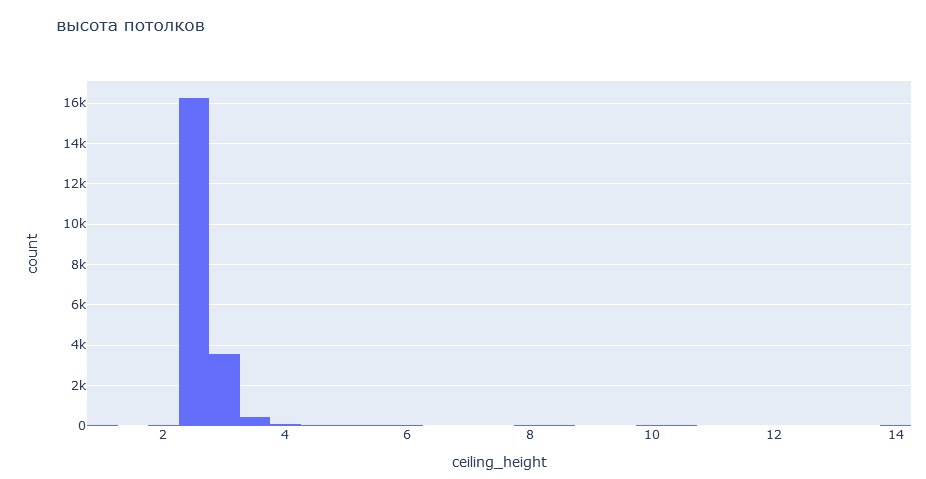

In [39]:
hist_creator(data,'floor',10)

count    20391.000000
mean         5.971703
std          4.928287
min          1.000000
25%          2.000000
50%          4.000000
75%          8.000000
max         33.000000
Name: floor, dtype: float64

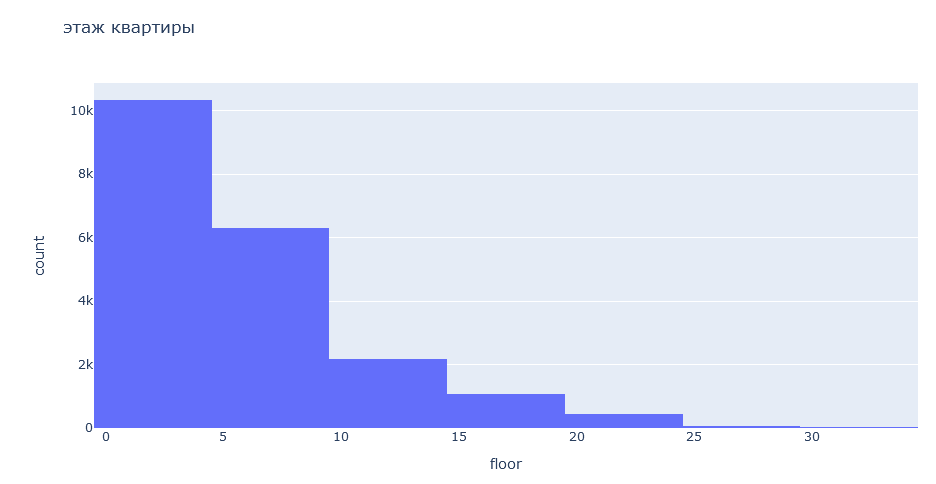

In [40]:
hist_creator(data,'floor_type',50)

count      20391
unique         3
top       другой
freq       15120
Name: floor_type, dtype: object

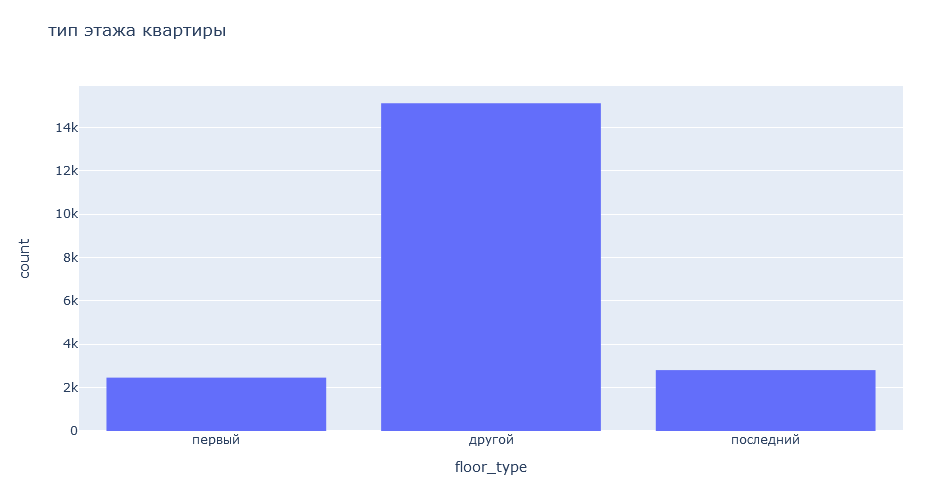

In [41]:
hist_creator(data,'floors_total',12)

count    20391.000000
mean        10.861949
std          6.648715
min          1.000000
25%          5.000000
50%          9.000000
75%         16.000000
max         60.000000
Name: floors_total, dtype: float64

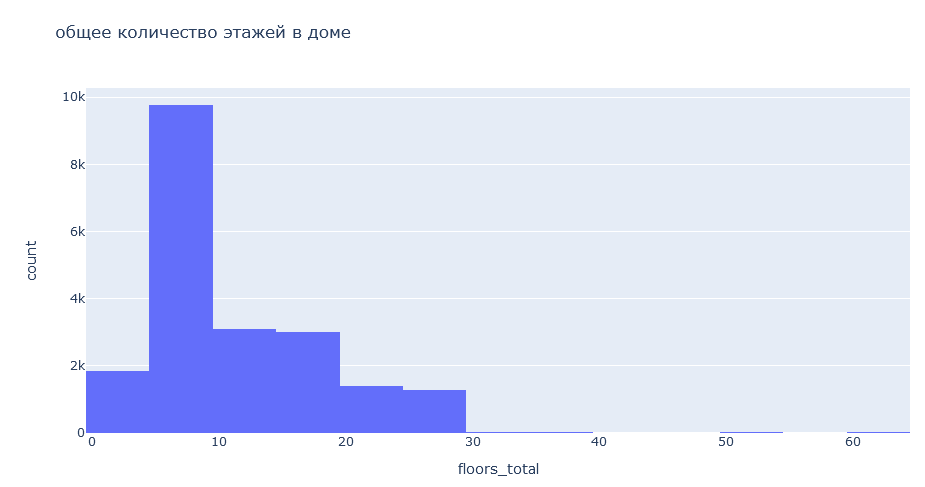

In [42]:
hist_creator(data,'airports_nearest',30)

count    15732.000000
mean     28842.028477
std      12710.493559
min          0.000000
25%      18490.000000
50%      26785.500000
75%      37407.000000
max      84869.000000
Name: airports_nearest, dtype: float64

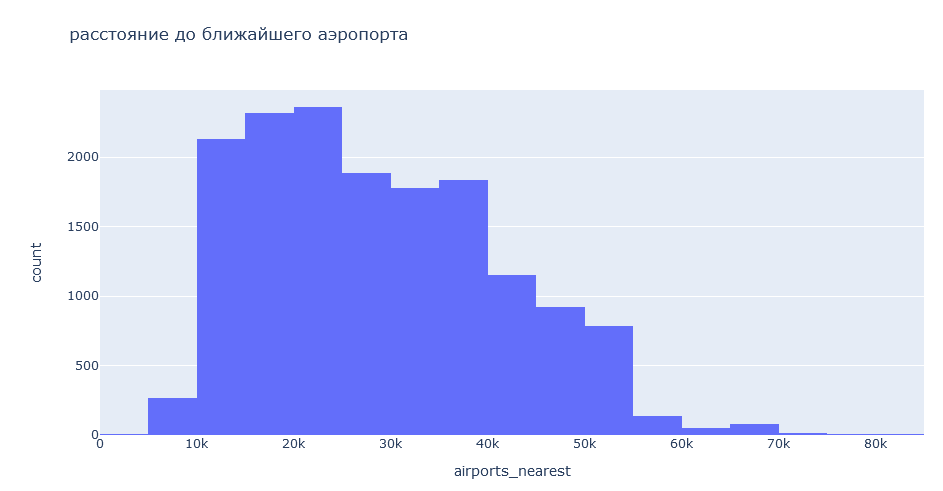

In [43]:
hist_creator(data,'parks_nearest',20)

count    6885.000000
mean      490.775744
std       344.678999
min         1.000000
25%       287.000000
50%       451.000000
75%       613.000000
max      3190.000000
Name: parks_nearest, dtype: float64

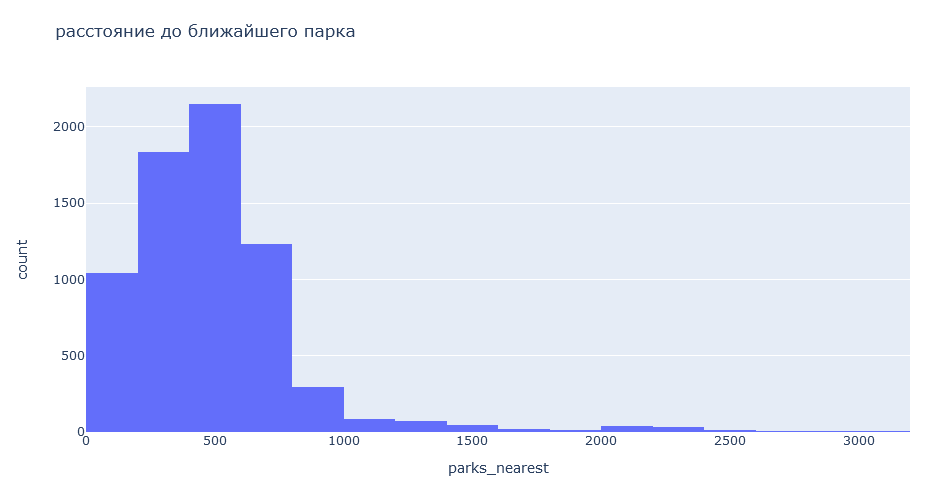

In [44]:
hist_creator(data,'day_of_week',7)

count    20391.000000
mean         2.583689
std          1.782578
min          0.000000
25%          1.000000
50%          3.000000
75%          4.000000
max          6.000000
Name: day_of_week, dtype: float64

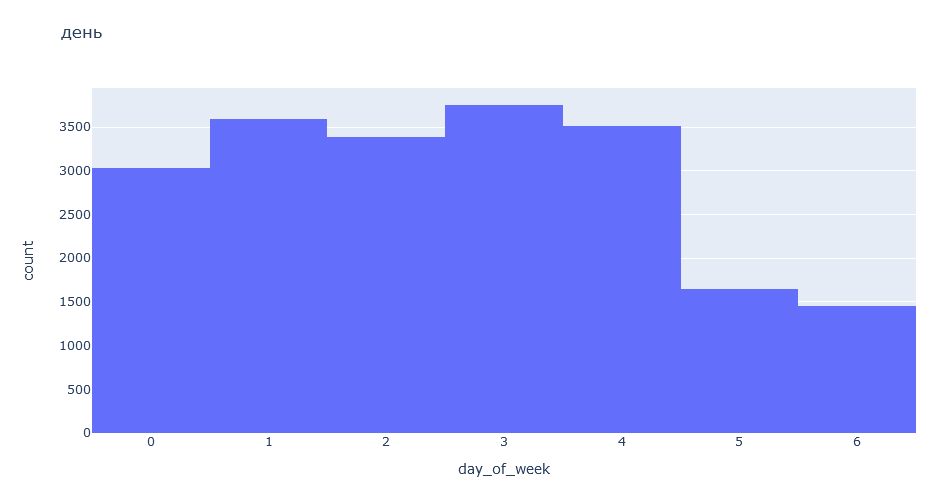

In [45]:
hist_creator(data,'month',12)

count    20391.000000
mean         6.586631
std          3.487951
min          1.000000
25%          3.000000
50%          7.000000
75%         10.000000
max         12.000000
Name: month, dtype: float64

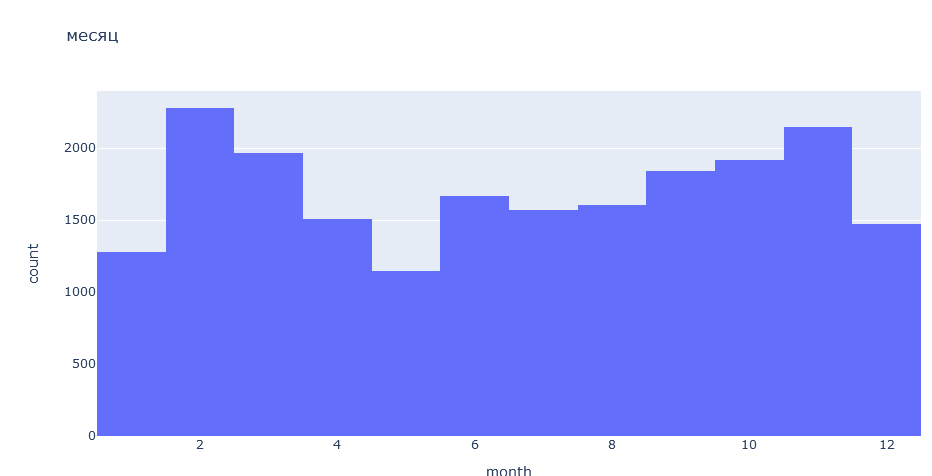

#### Изучение параметров
**Общая площадь**: 
- подавляющая часть объектов имеет площадь 30 - 85 м2
- средняя площадь квартир 50,8 м2
- максимальная площадь объекта 618 м2
- так же есть квартиры с очень маленькой площадью (от 12 до 20 м2) - скорее всего это комнаты в общежитиях

**Жилая площадь**:
- более 5 тыс объектов с размером жилой площади 15-20 м2, логично предположить, что это небольние однокомнатные квартиры.
- в среднем размер жилой площади составляет 30 м2
- редкие случаи, где жилая площадь превышает 100 м2
- масимальный размер - 409 м2

**Площадь кухни**:
- в основном площадь кухни в диапазоне 5-13 м2 (в срденем 9 м2)
- есть неправдоподобно маленькие кухни 2-3 м2
- редко когда площадь кухни больше 30 м2
- максимальная площадь кухни - 107 м2.

**Цена объекта**:
- цена большей части объектов до 10 млн (при средней в 4,5 млн)
- максимальная стоимость объекта - 401,3 млн.

**Количество комнат**:
- в большинстве случаев в квартире до 3 комнат. (при средней в 2 комнаты)
- есть объекты с кол-вом комнат = 0, у большей части из них есть жилая площадь, скорее всего так обозначаются комнаты в коммунальных квартирах или в общежитиях
- есть объект с 19 комнатами, его жилая площадь в 264,5 м2 позволяет

**Высота потолков**:
- высота потолков в среднем 2,25 - 2,75 м, реже до 3,2 м
- есть квартиры с высотой потолка выше 14 м, возможно это 2х уровневые петнхаусы или питерская архитектурная специфика, либо ошибка в объявлении.

**Этаж квартиры**:
- подавляющее кол-во квартир не выше 9 этажа
- максимальный этаж - 33

**Тип этажа квартиры**:
- в основном продаются квартиры выше первого и ниже последнего этажей
- квартир на первом и на последнем этажах продается примерно поровну

**Общее количество этажей в доме**:
- чаще всего квартиры располагаются в 5-ти - 9-ти этажных домах.
- дома выше 30 этажа встречаются крайне редко
- максимальная высота - 60 этажей

**Расстояние до ближайшего аэропорта**:
- чаще всего объекты расположены на расстоянии 10-40 км от ближайшего аэропорта
- в среднем это расстояние составляет 27 км
- из графика видно, что аэропорт считается ближайшим для населенных пунктов в радиусе 85 км.

**Расстояние до ближайшего парка**:
- в общем случае раччтояние до ближайшего парка в пределах 800 м
- средний показатель 450 м
- максимальное расстояние - 3 190 м

**День**:
- объявления выкладываются в основном в будние дни
- и чем ближе к выходным тем больше объявлений

**Месяц**:
- пики публикаций объявлений весной и осенью, как раз в периоды сезонных обострений
- при этом весной количество объявлений снижается от пикового значения в феврале до мая
- а осенью - обратная картина, начиная с сентября количество публикаций растет ближе к новому году


#### Скорость продажи квартир

In [46]:
hist_creator(data,'days_exposition',200)

count    20391.000000
mean       180.760777
std        219.742556
min          1.000000
25%         45.000000
50%         95.000000
75%        231.000000
max       1580.000000
Name: days_exposition, dtype: float64

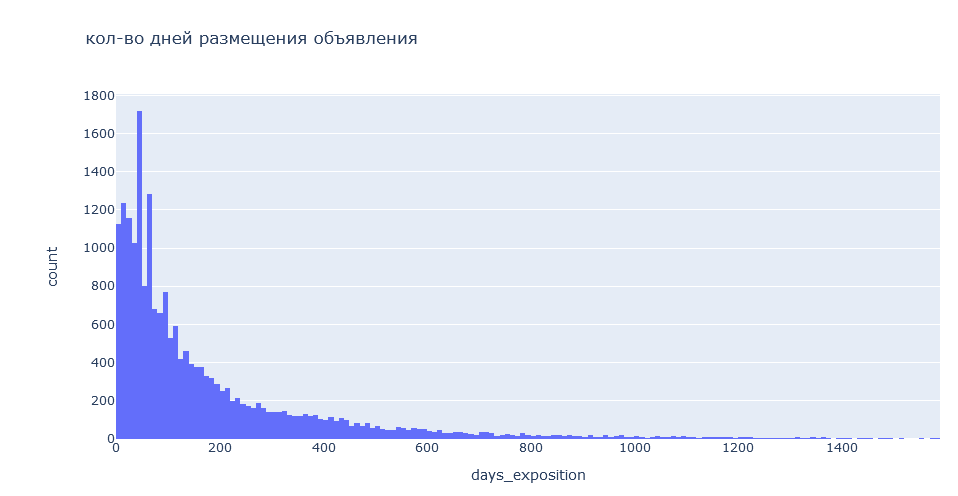

In [47]:
data.days_exposition.describe()

count    20391.000000
mean       180.760777
std        219.742556
min          1.000000
25%         45.000000
50%         95.000000
75%        231.000000
max       1580.000000
Name: days_exposition, dtype: float64

- Средняя кол-ва дней размещения объявления больше медианы, проимерно, в 2 раза, что говорит о наличии выбросов, которые так же наблюждаем на гистограмме.
- По этой причине среднюю скорость продажи квартиры принимаем медиану, то есть - 95 дней.
- Так же достаточно часто бывает, что квартира продажется в перые 9 дней после публикации объявления.
- Такие продажи можно считать - быстрыми.
- За необычно долгое время продажи можно принять 3 квартиль, а именно 231 день, округлим до 230, то есть продажи более 230 дней мы считаем "необычно долгими".


#### Факторы, которые влияют на общую стоиомость объекта

In [48]:
# Функция построения графиков и расчета корреляции

def scatter_creator(df,index,alpha,price_range_left=-20,price_range_right=405):
    
    price_range_left *= 1000000
    price_range_right *= 1000000
    
    print('Корреляция цены и показателя - '+ cols_names[index])
    
    correlation = df[['last_price',index]].corr()
    display(correlation)
    
    fig_common = px.scatter(df,
                     x='last_price',
                     y=index,
                     title='Зависимость цены от ' + cols_names[index] + '(общий)',
                     opacity=alpha,)
    fig_common.show()
    
    fig_dig = px.scatter(df,
                     x='last_price',
                     y=index,
                     title='Зависимость цены от ' + cols_names[index] + '(укрупненный)',
                     opacity=alpha,
                     range_x=(price_range_left,price_range_right))
    fig_dig.show()

In [49]:
scatter_creator(df=data,index='total_area',alpha=0.3,price_range_left=0,price_range_right=50)

Корреляция цены и показателя - общая площадь


,last_price,total_area
last_price,1.000000,0.688792
total_area,0.688792,1.000000


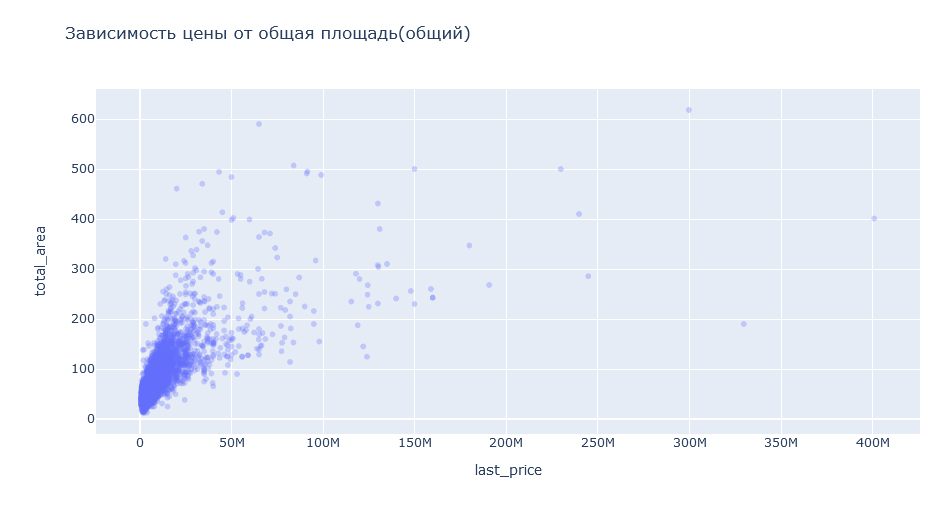
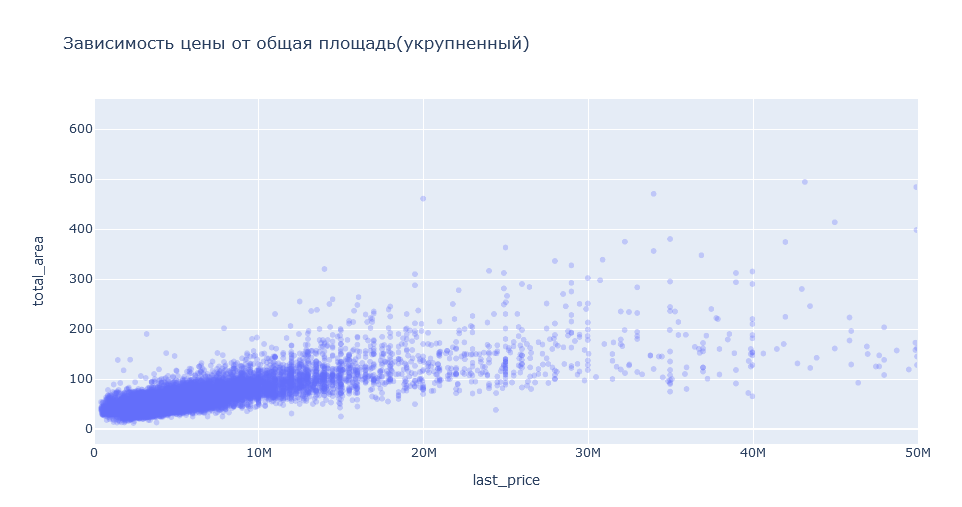

In [50]:
scatter_creator(df=data,index='living_area',alpha=0.3,price_range_left=0,price_range_right=50)

Корреляция цены и показателя - жилая площадь


,last_price,living_area
last_price,1.00000,0.59968
living_area,0.59968,1.00000


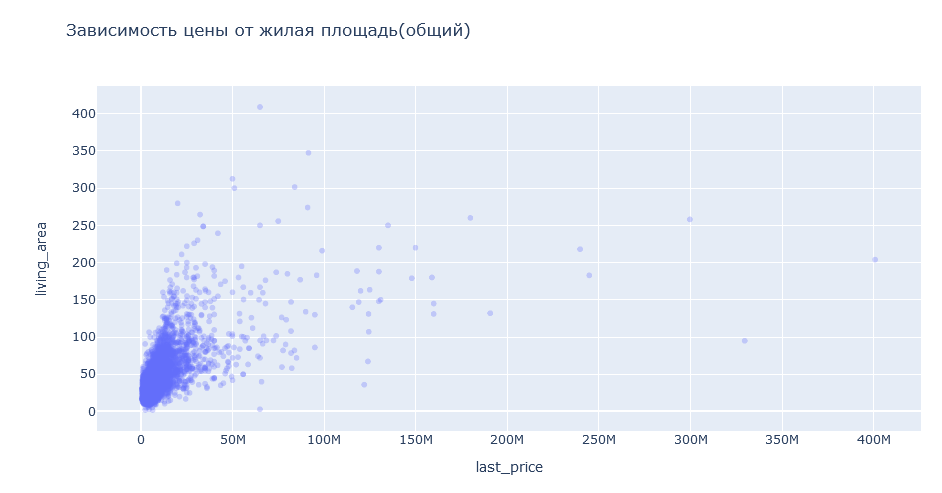
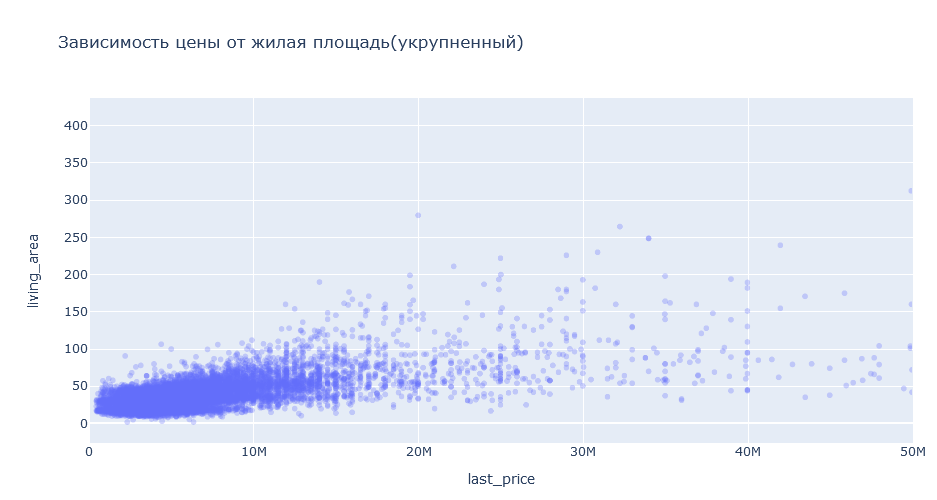

In [51]:
scatter_creator(df=data,index='kitchen_area',alpha=0.3,price_range_left=0,price_range_right=50)

Корреляция цены и показателя - площадь кухни


,last_price,kitchen_area
last_price,1.000000,0.499414
kitchen_area,0.499414,1.000000


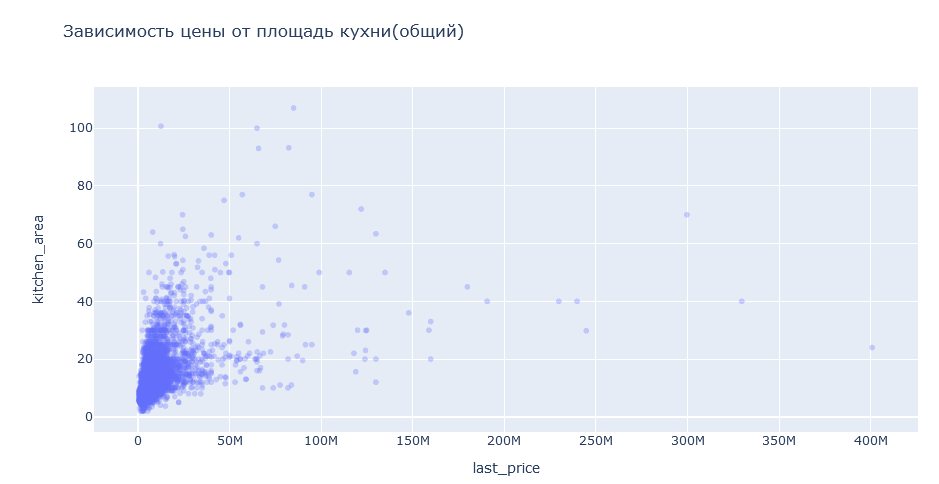
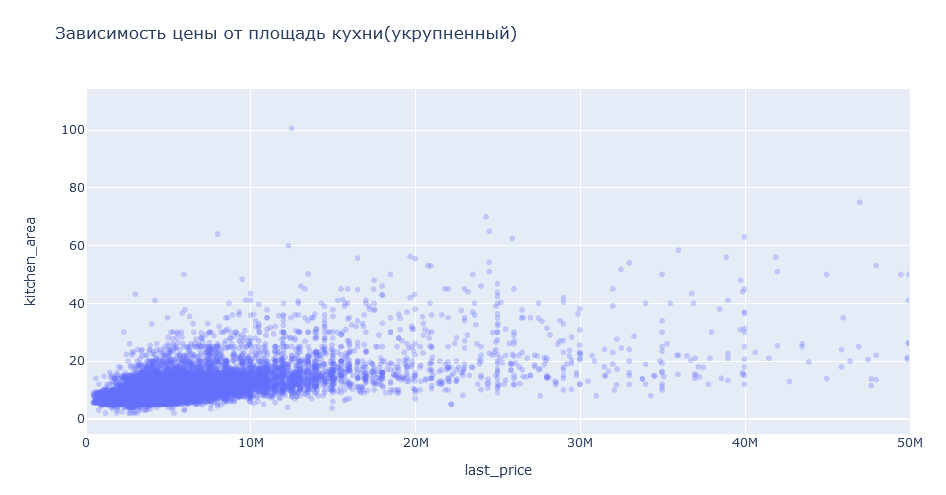

In [52]:
# Функция построения столбцатой диаграммы
def bar_creator(df,index,aggfunc):
    
    print('Корреляция цены и показателя - '+ cols_names[index])
    
    correlation = df[['last_price',index]].corr()
    display(correlation)
    
    pivot = data.pivot_table(index=index,values='last_price', aggfunc=aggfunc)

    fig = px.bar(pivot, title='Зависимость цены от покзателя - '+ cols_names[index])
    fig.show()

In [53]:
bar_creator(df=data,index='rooms',aggfunc='median')

Корреляция цены и показателя - количество комнат


,last_price,rooms
last_price,1.000000,0.385749
rooms,0.385749,1.000000


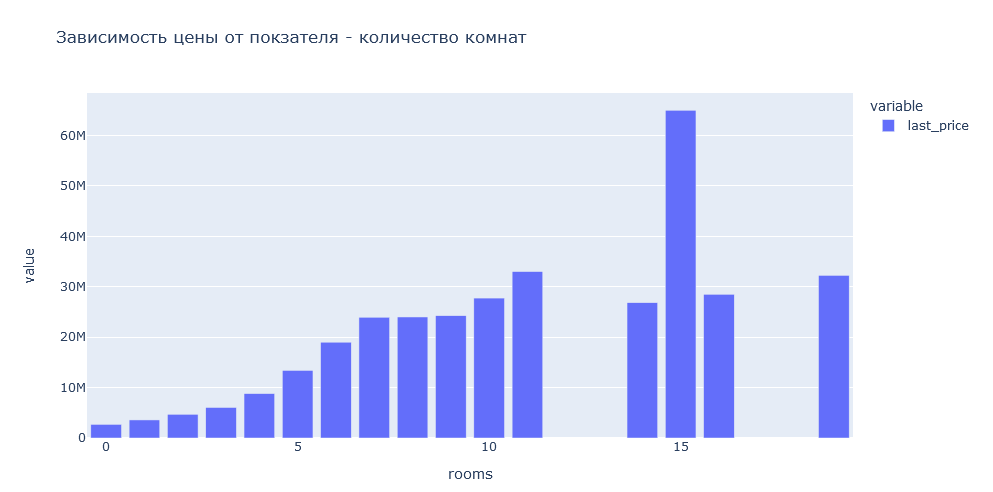

In [54]:
bar_creator(df=data,index='floor_type',aggfunc='median')

Корреляция цены и показателя - тип этажа квартиры


C:\Users\ilin_\AppData\Local\Temp\ipykernel_9032\3472202267.py:6: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,last_price
last_price,1.0


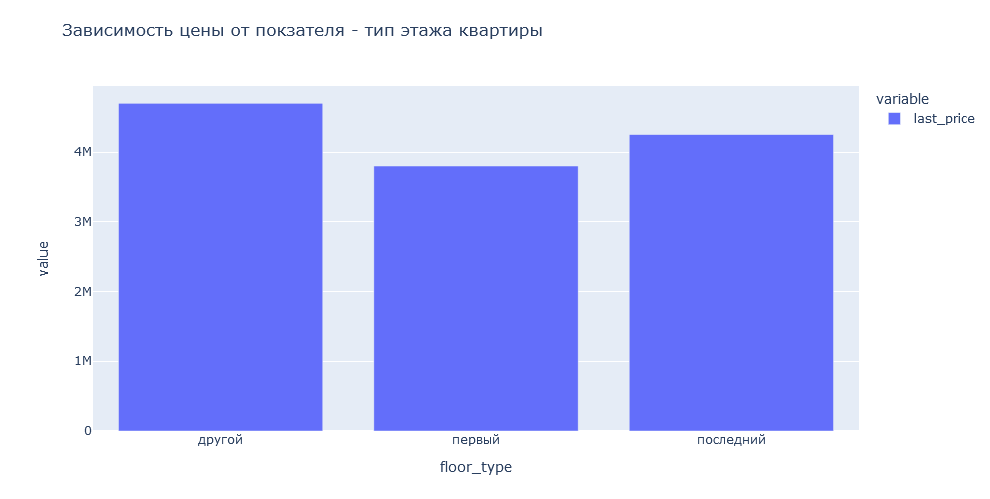

In [55]:
bar_creator(df=data,index='day_of_week',aggfunc='median')

Корреляция цены и показателя - день


,last_price,day_of_week
last_price,1.000000,0.000468
day_of_week,0.000468,1.000000


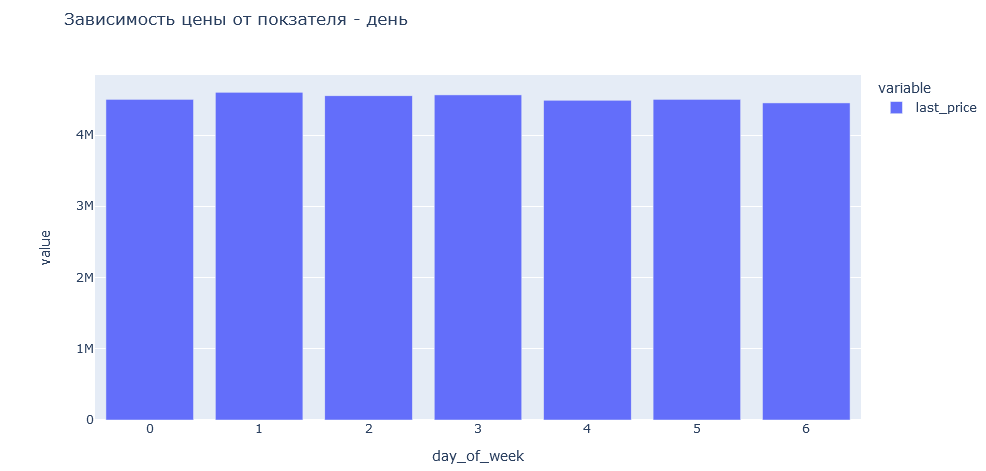

In [56]:
bar_creator(df=data,index='month',aggfunc='median')

Корреляция цены и показателя - месяц


,last_price,month
last_price,1.00000,0.00033
month,0.00033,1.00000


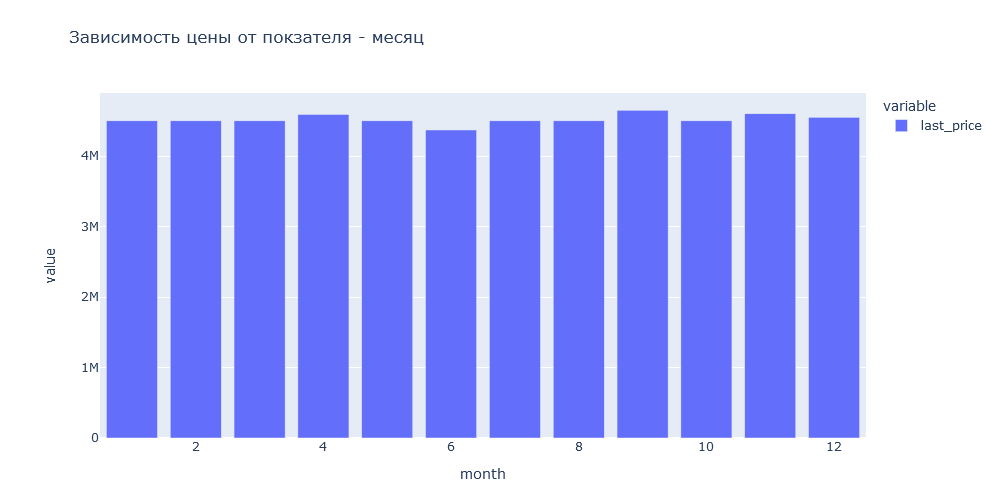

In [57]:
bar_creator(df=data,index='year',aggfunc='median')

Корреляция цены и показателя - год


,last_price,year
last_price,1.000000,-0.071461
year,-0.071461,1.000000


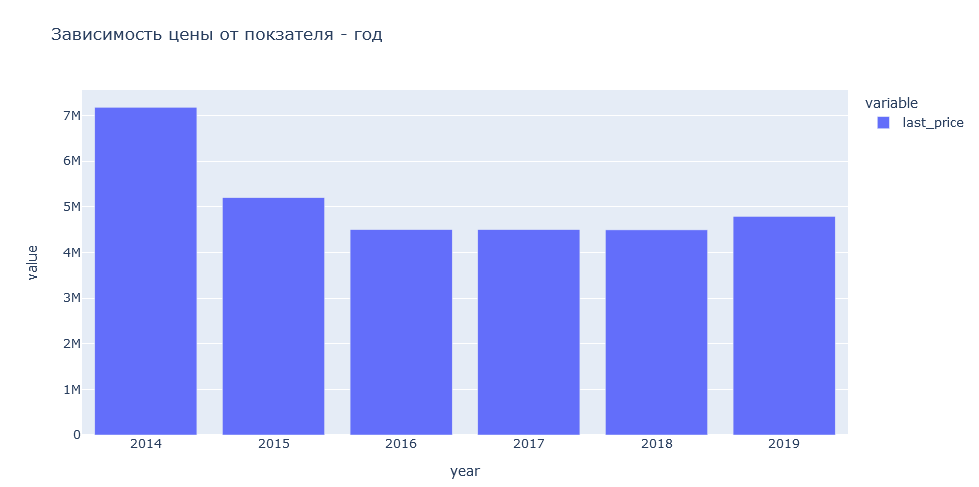

- Цена зависит от общей площади. Об этом говорит корреляция равная 0,69, и на укрупненном графике видно, как с увеличением лощади растет и стоимость объект
- Практически ту же самую зависимость видим на графиках жилой площади и кухни, с чуть меньшей корреляцией.
- Так же есть зависимость стоимости объекта от количства комнат с положительной корреляцией 0,39
- Квартиры на первом и последнем этажах дешевле промежуточных
- Зависимости цены от дня и месяца не выявлено
- Корреляция года и цены около 0, но из графика видно что цена падала с 2014 года до 2018. В 2019 цена немного подрасла.

#### Стоимость объекта в расчете на 1 м2

In [58]:
# Топ 10 населенных пунктов по количеству объявлений
data.groupby(by='locality_name' )['locality_name'].count().sort_values(ascending=False).head(10)

locality_name
Санкт-Петербург      13574
посёлок Мурино         547
посёлок Шушары         407
Всеволожск             339
Колпино                308
Пушкин                 307
посёлок Парголово      302
деревня Кудрово        299
Гатчина                268
Выборг                 208
Name: locality_name, dtype: int64

In [59]:
pivot = data.pivot_table(index='locality_name', values='sqr_meter_price', aggfunc=['count','max','min'])
pivot.columns = ['Кол-во объявлений','Цена за кв. метр максимальная','Цена за кв. метр минимальная']
pivot = pivot.sort_values('Кол-во объявлений', ascending=False).head(10)
pivot

,Кол-во объявлений,Цена за кв. метр максимальная,Цена за кв. метр минимальная
locality_name,,,
Санкт-Петербург,13574,1736842.11,15345.27
посёлок Мурино,547,138580.25,50000.00
посёлок Шушары,407,147826.09,47833.33
Всеволожск,339,640422.35,31400.00
Колпино,308,125000.00,47957.37
Пушкин,307,256521.74,59836.07
посёлок Парголово,302,138522.43,39205.96
деревня Кудрово,299,142857.14,54160.35
Гатчина,268,105818.18,10507.25


In [60]:
pivot[pivot['Цена за кв. метр максимальная'] == max(pivot['Цена за кв. метр максимальная'])]

,Кол-во объявлений,Цена за кв. метр максимальная,Цена за кв. метр минимальная
locality_name,,,
Санкт-Петербург,13574,1736842.11,15345.27


*Ожидаемо, что в Санкт_Петербурге самая высокая максимальная цена за кв. метр.*

In [61]:
pivot[pivot['Цена за кв. метр минимальная'] == min(pivot['Цена за кв. метр минимальная'])]

,Кол-во объявлений,Цена за кв. метр максимальная,Цена за кв. метр минимальная
locality_name,,,
Гатчина,268,105818.18,10507.25


*В Гатчине самая низкая минимальная цена за кв. метр*

In [62]:
data.columns

Index(['total_images', 'last_price', 'total_area', 'first_day_exposition',
       'rooms', 'ceiling_height', 'floors_total', 'living_area', 'floor',
       'is_apartment', 'studio', 'open_plan', 'kitchen_area', 'balcony',
       'locality_name', 'airports_nearest', 'cityCenters_nearest',
       'parks_around3000', 'parks_nearest', 'ponds_around3000',
       'ponds_nearest', 'days_exposition', 'sqr_meter_price', 'day_of_week',
       'month', 'year', 'floor_type', 'cityCenters_nearest_km'],
      dtype='object')

In [63]:
spb_flats = data.query('locality_name == "Санкт-Петербург"').copy()
spb_flats['one_km_centre_price'] = spb_flats.last_price / spb_flats.cityCenters_nearest_km
spb_flats['one_km_centre_price'] = spb_flats['one_km_centre_price'].round(2)

spb_flats.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_around3000,ponds_nearest,days_exposition,sqr_meter_price,day_of_week,month,year,floor_type,cityCenters_nearest_km,one_km_centre_price
1,10,5196000.0,56.0,2015-08-20,2,2.65,5,34.3,4,False,...,2,574.0,558,92785.71,3,8,2015,другой,14.0,371142.86
2,0,64900000.0,159.0,2015-07-24,3,2.65,14,NaN,9,False,...,3,234.0,424,408176.10,4,7,2015,другой,7.0,9271428.57
3,2,10000000.0,100.0,2018-06-19,2,3.03,14,32.0,13,False,...,1,48.0,121,100000.00,1,6,2018,другой,8.0,1250000.00
7,18,5400000.0,61.0,2017-02-26,3,2.50,9,43.6,7,False,...,0,NaN,289,88524.59,6,2,2017,другой,15.0,360000.00
8,5,5050000.0,39.6,2017-11-16,1,2.67,12,20.3,3,False,...,2,553.0,137,127525.25,3,11,2017,другой,14.0,360714.29


In [64]:
correlation = data[['last_price','cityCenters_nearest_km']].corr()
display(correlation)

pivot = data.pivot_table(index='cityCenters_nearest_km',values='last_price', aggfunc='mean')

fig = px.line(pivot, title='Зависимость стоимости км от расстояния до центра от показателя')
fig.show()

,last_price,cityCenters_nearest_km
last_price,1.000000,-0.226663
cityCenters_nearest_km,-0.226663,1.000000


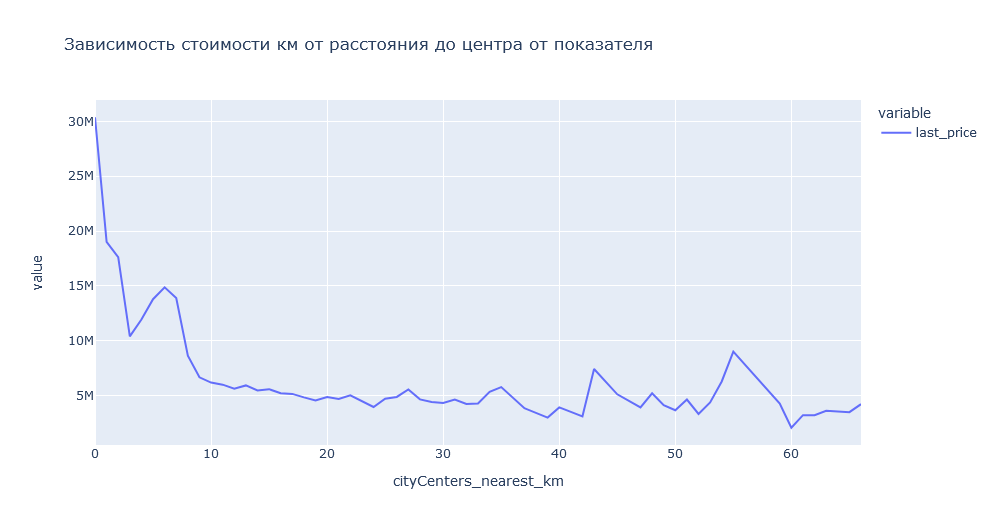

Как видно из графика - чем чем дальше от центра, тем дешевле цена объекта. Отрицательная корреляция.

### Общий вывод


- подавляющая часть объектов имеет площадь 30 - 85 м2
- средняя площадь квартир 50,8 м2
- максимальная площадь объекта 618 м2
- так же есть квартиры с очень маленькой площадью (от 12 до 20 м2) - скорее всего это комнаты в общежитиях

- более 5 тыс объектов с размером жилой площади 15-20 м2, логично предположить, что это небольние однокомнатные квартиры.
- в среднем размер жилой площади составляет 30 м2
- редкие случаи, где жилая площадь превышает 100 м2
- масимальный размер - 409 м2

- в основном площадь кухни в диапазоне 5-13 м2 (в срденем 9 м2)
- есть неправдоподобно маленькие кухни 2-3 м2
- редко когда площадь кухни больше 30 м2
- максимальная площадь кухни - 107 м2.

- цена большей части объектов до 10 млн (при средней в 4,5 млн)
- максимальная стоимость объекта - 401,3 млн.

- в большинстве случаев в квартире до 3 комнат. (при средней в 2 комнаты)
- есть объекты с кол-вом комнат = 0, у большей части из них есть жилая площадь, скорее всего так обозначаются комнаты в коммунальных квартирах или в общежитиях
- есть объект с 19 комнатами, его жилая площадь в 264,5 м2 позволяет

- высота потолков в среднем 2,25 - 2,75 м, реже до 3,2 м
- есть квартиры с высотой потолка выше 14 м, возможно это 2х уровневые петнхаусы или питерская архитектурная специфика, либо ошибка в объявлении.

- подавляющее кол-во квартир не выше 9 этажа
- максимальный этаж - 33

- в основном продаются квартиры выше первого и ниже последнего этажей
- квартир на первом и на последнем этажах продается примерно поровну

- чаще всего квартиры располагаются в 5-ти - 9-ти этажных домах.
- дома выше 30 этажа встречаются крайне редко
- максимальная высота - 60 этажей

- чаще всего объекты расположены на расстоянии 10-40 км от ближайшего аэропорта
- в среднем это расстояние составляет 27 км
- из графика видно, что аэропорт считается ближайшим для населенных пунктов в радиусе 85 км.

- в общем случае раччтояние до ближайшего парка в пределах 800 м
- средний показатель 450 м
- максимальное расстояние - 3 190 м

- объявления выкладываются в основном в будние дни
- и чем ближе к выходным тем больше объявлений

- пики публикаций объявлений весной и осенью, как раз в периоды сезонных обострений
- при этом весной количество объявлений снижается от пикового значения в феврале до мая
- а осенью - обратная картина, начиная с сентября количество публикаций растет ближе к новому году

- средняя кол-ва дней размещения объявления больше медианы, проимерно, в 2 раза, что говорит о наличии выбросов, которые так же наблюждаем на гистограмме.
- по этой причине среднюю скорость продажи квартиры принимаем медиану, то есть - 95 дней.
- так же достаточно часто бывает, что квартира продажется в перые 9 дней после публикации объявления.
- такие продажи можно считать - быстрыми.
- за необычно долгое время продажи можно принять 3 квартиль, а именно 231 день, округлим до 230, то есть продажи более 230 дней мы считаем "необычно долгими".

- цена зависит от общей площади. Об этом говорит корреляция равная 0,69, и на укрупненном графике видно, как с увеличением лощади растет и стоимость объект
- практически ту же самую зависимость видим на графиках жилой площади и кухни, с чуть меньшей корреляцией.
- так же есть зависимость стоимости объекта от количства комнат с положительной корреляцией 0,39
- квартиры на первом и последнем этажах дешевле промежуточных
- зависимости цены от дня и месяца не выявлено
- корреляция года и цены около 0, но из графика видно что цена падала с 2014 года до 2018. В 2019 цена немного подрасла.

- как видно из графика - чем чем дальше от центра, тем дешевле цена объекта. У цены и расстояния до центра отрицательная корреляция.